In [1]:
import numpy as np
import os
import xarray as xr
import glob
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.colors import BoundaryNorm
import matplotlib.colors as mcolors
import dask.array as da
import pickle
from scipy.stats import t
import matplotlib.ticker as ticker
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.ticker import FuncFormatter
from datetime import timedelta
from matplotlib.patches import Rectangle
from cartopy.mpl.gridliner import LongitudeFormatter, LatitudeFormatter
import tkinter as tk
from tkinter import ttk
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.patches import Rectangle
import numpy as np
import xarray as xr
import matplotlib
%matplotlib inline

In [2]:
# reading in ERA5 u, v, w and q

base_path = '/data/rong4/Data/ERA5/3hourly/quvw_US'

years = [str(year) for year in range(2001, 2019)]

def get_files(folder, component):

    files = glob.glob(os.path.join(base_path, folder, f"era5.{component}.*.nc"))

    filtered_files = [f for f in files if any(year in f for year in years)]
    
    return filtered_files

# Get the files for each component

u_files = get_files('u_component_of_wind', 'u_component_of_wind')

v_files = get_files('v_component_of_wind', 'v_component_of_wind')

w_files = get_files('vertical_velocity', 'vertical_velocity')

q_files = get_files('specific_humidity', 'specific_humidity')

all_files = u_files + v_files + q_files + w_files

# open all datasets at once

uvq = xr.open_mfdataset(all_files, combine='by_coords', chunks={'time': 24})

uvq['time'] = uvq['time'] - pd.Timedelta(hours=6)

# consider selecting 900 as well 

winds = uvq.sel(level=uvq.level.isin([850, 900]))

winds = winds.where(
    
    (winds.time.dt.hour.isin([0, 6, 12])) &
    
    (winds.time.dt.month.isin([5, 6, 7, 8, 9])) &
    
    (winds.time.dt.year.isin(range(2001, 2019))),
    
    drop=True
)

winds_avg = winds.resample(time='D').mean().dropna(dim='time', how='all')

winds_avg = winds_avg.mean(dim='level')

KeyboardInterrupt: 

In [ ]:
times = winds_avg['time'].data

pressure = uvq['level'].data

us_latitude = winds_avg['latitude'].data

us_longitude = winds_avg['longitude'].data

In [244]:
# with open('pressure.pkl', 'wb') as f:
    
#     pickle.dump(pressure, f)

# sgp_latitude = np.arange(30, 39.25, 0.25)

# sgp_longitude = np.arange(-105, -94.75, 0.25)

# with open('sgp_latitudes.pkl', 'wb') as f:
    
#     pickle.dump(sgp_latitude, f)
    
# with open('sgp_longitudes.pkl', 'wb') as f:
    
#     pickle.dump(sgp_longitude, f)


In [10]:
file_pattern = '/home/annierosen16/data/era5sgp/era5_ml_divergence_full_us/*.nc'

files = glob.glob(file_pattern)

# contains 6, 12, 18 UTC -> 0, 6, 12 CST and pressure levels 900 and 850

convergence = xr.open_mfdataset(files, combine='by_coords')

In [15]:
convergence = convergence.sel(valid_time=convergence.valid_time.dt.month.isin([5, 6, 7, 8, 9]))

convergence = convergence.assign_coords(valid_time=convergence.valid_time - np.timedelta64(6, 'h'))

# selecting both pressure levels (900 and 850) and all times

conv = convergence.resample(valid_time='D').mean().dropna(dim='valid_time', how='all')

conv_mean = conv.mean(dim='pressure_level')

In [16]:
# correcting so that positive indicates convergence

all_convergence = conv_mean['d'].load().data * -1

In [22]:
# removes underground values, contains advections and mean wind profiles

with open('/home/annierosen16/master_clean.pkl', 'rb') as f:
    
    master = pickle.load(f)

### mean convergence within 0.5 and 2 degree gridbox for every day

In [26]:
master['mean_0.5deg_convergence'] = None

master['mean_2deg_convergence'] = None  

for date in range(master.shape[0]):

    target_date = np.datetime64(master['date'].iloc[date])  # Convert to numpy datetime64
    
    date_idx = np.where(times == target_date)[0][0]

    lat_idx = master['latitude'].iloc[date]
    
    lon_idx = master['longitude'].iloc[date]

    # Define window sizes
    
    for delta, col_name in [(0.5, 'mean_0.5deg_convergence'), (1.0, 'mean_2deg_convergence')]:
        
        # Apply lat/lon masks for the given window size
        lat_mask = (us_latitude >= (lat_idx - delta)) & (us_latitude <= (lat_idx + delta))
        
        lon_mask = (us_longitude >= (lon_idx - delta)) & (us_longitude <= (lon_idx + delta))

        # Extract indices
        lat_indices = np.where(lat_mask)[0]
        
        lon_indices = np.where(lon_mask)[0]

        # Extract mini domain for convergence
        conv_mini = all_convergence[date_idx, :, :]  # Extracts a 2D (lat, lon) slice

        # Apply masks
        conv_mini = conv_mini[lat_mask, :][:, lon_mask]

        # Compute mean convergence for this window size
        conv_avg = np.mean(conv_mini)

        # Assign the computed mean to the correct column
        master.at[date, col_name] = conv_avg


In [28]:
master = master.drop(columns=['mean_2deg_all_convergence'])

master = master.rename(columns={
    
    'mean_1deg_all_convergence': 'mean_2deg_convergence',
    
    'mean_0.5deg_all_convergence': 'mean_0.5deg_convergence'

})

### adding columns to master for w at 700 hpa, v at 900 hpa, meridional advection at 900 hpa

In [32]:
# positive indicates ascent, negative indicates descent

master['mean_w_profile'] = master['mean_w_profile'].apply(lambda x: -x)

# adding 700 hpa w value as a column 

idx_700 = np.where(pressure == 700)[0][0]

master['w_700'] = master['mean_w_profile'].apply(lambda x: x[idx_700] if len(x) > 20 else None)

### defining wet apes and dry apes

In [33]:
wetapes = master[master['wetape']==True]

dryapes = master[master['dryape']==True]

### general distributions of local (0.5 deg) vs. regional (2 deg) convergence
#### doesn't appear to show a preference locally or regionally for wetapes over dryapes, if anything is it the opposite

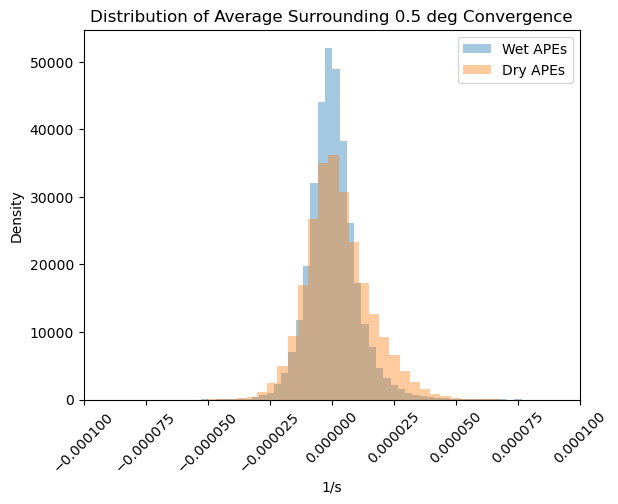

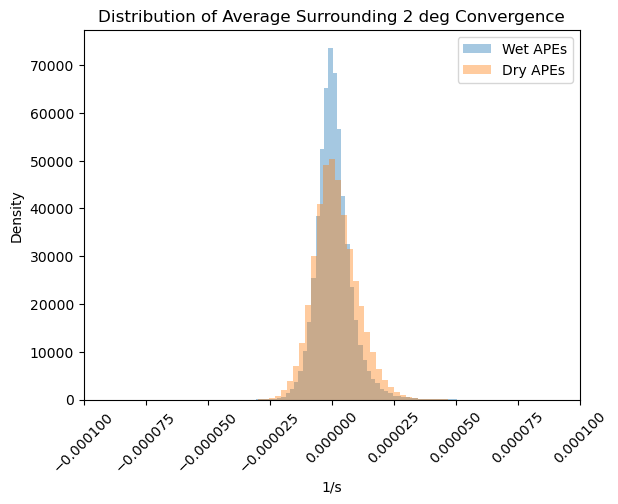

In [89]:
plt.hist(wetapes['mean_0.5deg_convergence'], bins=50, alpha=0.4, label='Wet APEs', density=True)

plt.hist(dryapes['mean_0.5deg_convergence'], bins=50, alpha=0.4, label='Dry APEs', density=True)

plt.xlim(-0.00010, 0.00010)

plt.xlabel('1/s')

plt.ylabel('Density')

plt.legend()

plt.title('Distribution of Average Surrounding 0.5 deg Convergence')

plt.xticks(rotation=45)

plt.show()

plt.hist(wetapes['mean_2deg_convergence'], bins=50, alpha=0.4, label='Wet APEs', density=True)

plt.hist(dryapes['mean_2deg_convergence'], bins=50, alpha=0.4, label='Dry APEs', density=True)

plt.xlim(-0.00010, 0.00010)

plt.xlabel('1/s')

plt.ylabel('Density')

plt.legend()

plt.title('Distribution of Average Surrounding 2 deg Convergence')

plt.xticks(rotation=45)

plt.show()

### sorting master, wetapes and dryapes by w (or sub for another variable)

In [37]:
master_sorted = master.sort_values(by='w_700', ascending=False).reset_index(drop=True)

wetapes_sorted = wetapes.sort_values(by='w_700', ascending=False).reset_index(drop=True)

dryapes_sorted = dryapes.sort_values(by='w_700', ascending=False).reset_index(drop=True)

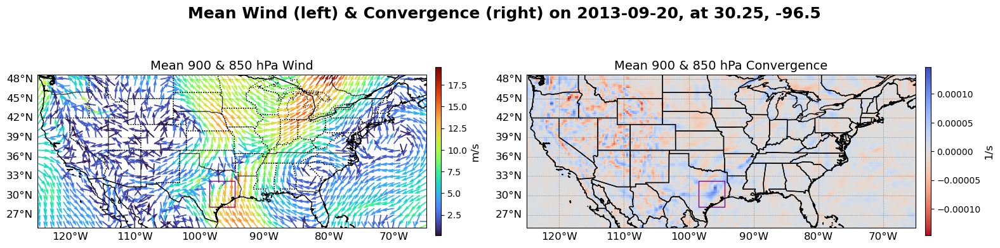

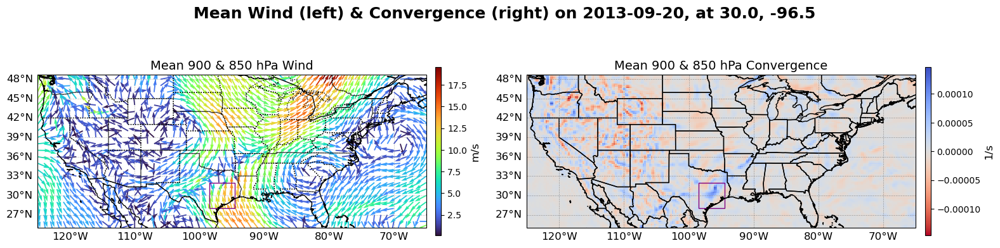

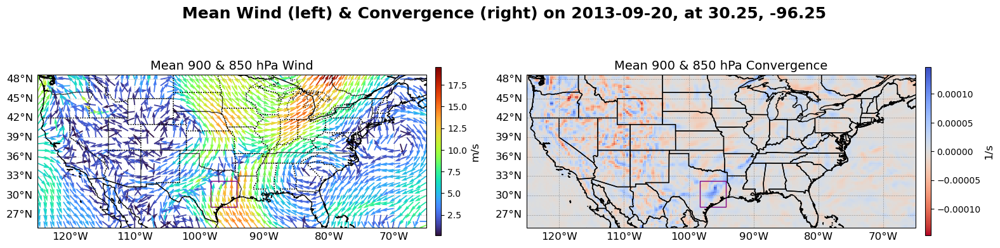

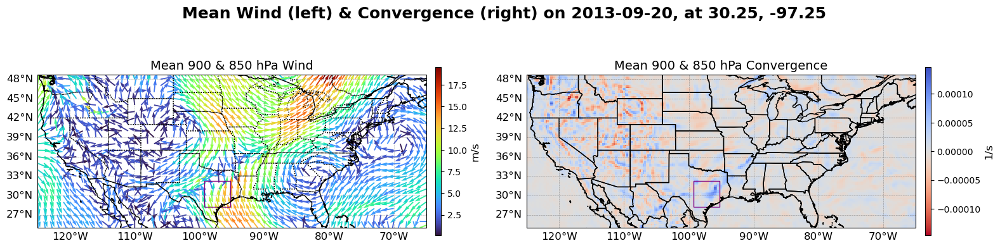

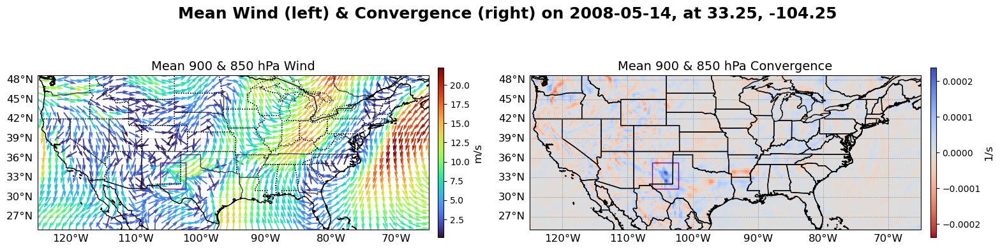

...

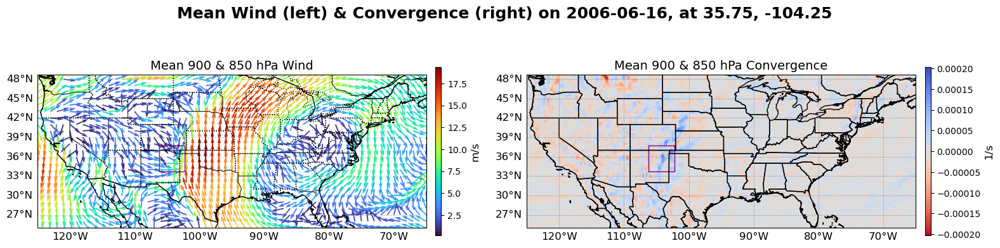

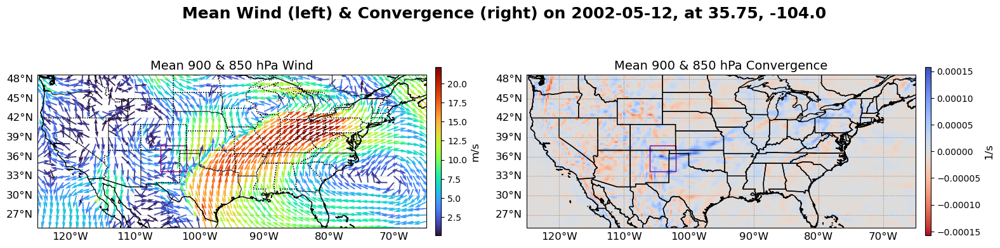

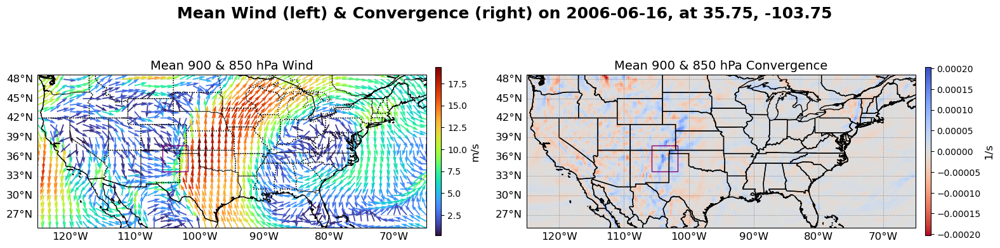

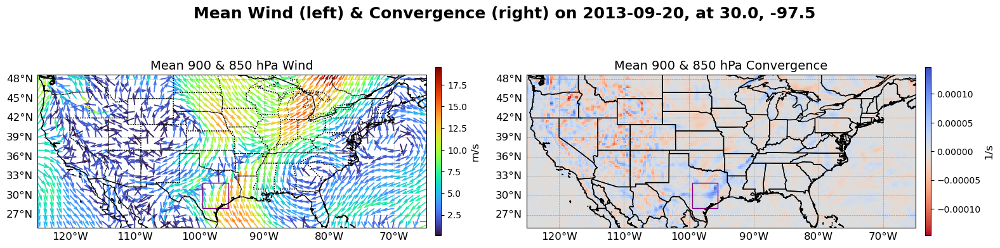

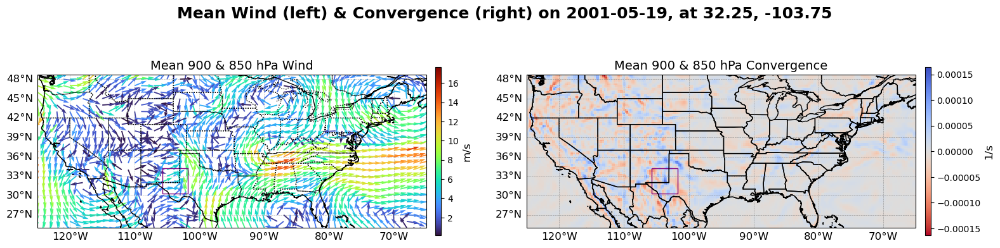

In [82]:
import warnings 

warnings.filterwarnings("ignore", category=FutureWarning, message="The `numpy.column_stack` function is not implemented by Dask array.")

for idx in range(0, 20, 1):
    
    sample_date = dryapes_sorted.iloc[idx]['date']
    
    date_for_fig = sample_date.date()
    
    sample_lat = dryapes_sorted.iloc[idx]['latitude']
    
    sample_lon = dryapes_sorted.iloc[idx]['longitude']
    
    # Find the index corresponding to the sample_date in the winds data
    winds_date_idx = np.where(times == sample_date)[0][0]
    
    # Extract u and v components for the specific date
    
    u_sample = winds_avg['u'][winds_date_idx, :, :].data
    
    v_sample = winds_avg['v'][winds_date_idx, :, :].data
    
    # Calculate wind speed
    wind_speed = np.sqrt(u_sample**2 + v_sample**2)
    
    # Normalize u and v components to have unit length
    u_normalized = u_sample / wind_speed
    
    v_normalized = v_sample / wind_speed
    
    # Create a meshgrid for longitude and latitude
    lon, lat = np.meshgrid(us_longitude, us_latitude)
    
    # Define the step size for subsampling (adjust as needed)
    step = 4  # Adjust based on your data resolution
    
    # Subsample the data
    lon_sub = lon[::step, ::step]
    
    lat_sub = lat[::step, ::step]
    
    u_sub = u_normalized[::step, ::step]
    
    v_sub = v_normalized[::step, ::step]
    
    wind_speed_sub = wind_speed[::step, ::step]
    
    # Create the figure with two subplots
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 14),
                                   
                                   subplot_kw={'projection': ccrs.PlateCarree()})
    
    plt.suptitle('Mean Wind (left) & Convergence (right) on {}, at {}, {}'.format(date_for_fig, 
                                                                                  sample_lat, 
                                                                                  sample_lon), fontweight='bold',
                y = 0.65, size=18)
    
    plt.subplots_adjust(top=0.70)  # Adjust this value as needed

    # Plot the wind vectors on the first subplot (ax1)
    ax1.add_feature(cfeature.COASTLINE)
    
    ax1.add_feature(cfeature.BORDERS)
    
    ax1.add_feature(cfeature.STATES, linestyle=':')
    
    q = ax1.quiver(lon_sub, lat_sub, u_sub, v_sub, wind_speed_sub, scale=30, width=0.003,
                   transform=ccrs.PlateCarree(), cmap='turbo')
    
    cbar = plt.colorbar(q, ax=ax1, orientation='vertical', pad=0.02, aspect=30, shrink=0.2)
    
    cbar.set_label('m/s', fontsize=12)
    
    ax1.set_extent([np.min(us_longitude), np.max(us_longitude), np.min(us_latitude), np.max(us_latitude)-5])
    
    gl1 = ax1.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    
    gl1.top_labels = False
    
    gl1.right_labels = False
    
    gl1.xformatter = LongitudeFormatter()
    
    gl1.yformatter = LatitudeFormatter()
    
    gl1.xlabel_style = {'size': 12, 'color': 'black'}
    
    gl1.ylabel_style = {'size': 12, 'color': 'black'}
    
    rect1 = Rectangle((sample_lon - 2, sample_lat - 2), 4.0, 4.0,
                      edgecolor='purple', facecolor='none', linewidth=1,
                      transform=ccrs.PlateCarree())
    
    ax1.add_patch(rect1)
    
    ax1.set_title(f'Mean 900 & 850 hPa Wind', size=14)
    
    # Plot the convergence on the second subplot (ax2)
    conv_date = conv_mean.sel(valid_time=sample_date)
    
    data = conv_date['d'] * -1
    
    ax2.set_extent([np.min(us_longitude), np.max(us_longitude), np.min(us_latitude), np.max(us_latitude)-5])
    
    pcm = data.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), x='longitude', y='latitude',
                               cmap='coolwarm_r', cbar_kwargs={'label': '1/s', 'orientation':'vertical', 
                                                               'pad': 0.02, 'aspect':30, 'shrink':0.2})
    pcm.colorbar.ax.set_ylabel('1/s', fontsize=12)

    
    ax2.coastlines(resolution='10m')
    
    ax2.add_feature(cfeature.STATES.with_scale('10m'), linewidth=1.0)
    
    rect2 = Rectangle((sample_lon - 2, sample_lat - 2), 4.0, 4.0,
                      
                      edgecolor='purple', facecolor='none', linewidth=1,
                      
                      transform=ccrs.PlateCarree())
    
    ax2.add_patch(rect2)
    
#     min_lat = sample_lat - 2
#     max_lat = sample_lat + 2
#     min_lon = sample_lon - 2
#     max_lon = sample_lon + 2
    
#     subset_data = conv_mean.sel(valid_time=sample_date,
#                                 latitude=slice(max_lat, min_lat),
#                                 longitude=slice(min_lon, max_lon))['d'] * -1
    
#     mean_value = subset_data.mean().compute().item()

    
    gl2 = ax2.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.7, linestyle='--')
    
    gl2.top_labels = False
    
    gl2.right_labels = False
    
    gl2.xformatter = LongitudeFormatter()
    
    gl2.yformatter = LatitudeFormatter()
    
    gl2.xlabel_style = {'size': 12, 'color': 'black'}
    
    gl2.ylabel_style = {'size': 12, 'color': 'black'}
    
    ax2.set_title('Mean 900 & 850 hPa Convergence', size=14)
    
    plt.tight_layout()
    
    plt.show()


### what does average wind field look like on warm-season days

In [109]:
u_mean = winds_avg['u'].mean(dim='time')

v_mean = winds_avg['v'].mean(dim='time')

u_mean = u_mean.load().data

print("u complete")

v_mean = v_mean.load().data

print("v complete")

u complete
v complete


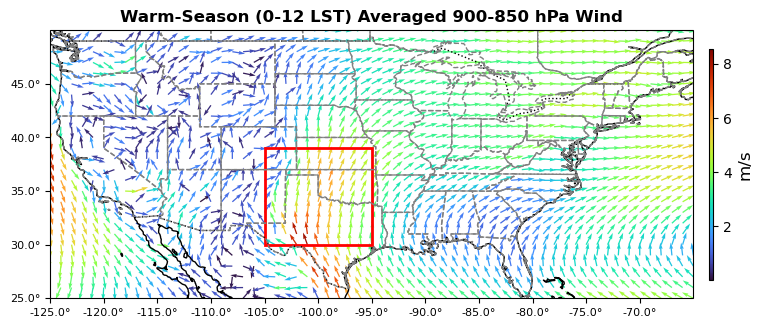

In [108]:
# Extract lat/lon data
lon = winds_avg['longitude'].data

lat = winds_avg['latitude'].data 

# Compute wind speed (magnitude)
wind_speed = np.sqrt(u_mean**2 + v_mean**2)

# Normalize wind vectors (unit vectors)
u_norm = u_mean / wind_speed

v_norm = v_mean / wind_speed

# Create a meshgrid for plotting
lon_grid, lat_grid = np.meshgrid(lon, lat)

# Define step size for subsampling (adjust for clarity)
step = 4  

# Subsample for better visualization
lon_sub = lon_grid[::step, ::step]

lat_sub = lat_grid[::step, ::step]

u_sub = u_norm[::step, ::step]  # Normalized vectors

v_sub = v_norm[::step, ::step]

wind_speed_sub = wind_speed[::step, ::step]  # Use original wind speed for color mapping

# Create a figure
fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})

# Add map features

ax.set_extent([lon.min(), lon.max(), lat.min(), lat.max()], crs=ccrs.PlateCarree())

ax.add_feature(cfeature.COASTLINE, linewidth=1)

ax.add_feature(cfeature.BORDERS, linestyle=':')

ax.add_feature(cfeature.STATES, linestyle='--', edgecolor='gray')

# Plot wind vectors, colored by wind speed
q = ax.quiver(lon_sub, lat_sub, u_sub, v_sub, wind_speed_sub, scale=50, width=0.002, cmap='turbo',
              norm=Normalize(vmin=wind_speed.min(), vmax=wind_speed.max()), transform=ccrs.PlateCarree())

# Add a colorbar
cbar = plt.colorbar(q, ax=ax, orientation='vertical', pad=0.02, aspect=50, shrink=0.5)

cbar.set_label('m/s', fontsize=12)

cbar.ax.tick_params(labelsize=10)

# Add latitude and longitude labels
ax.set_xticks(np.arange(lon.min(), lon.max(), step=5), crs=ccrs.PlateCarree())  # Adjust step for clarity

ax.set_yticks(np.arange(lat.min(), lat.max(), step=5), crs=ccrs.PlateCarree())

ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.1f}°'))

ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.1f}°'))

ax.tick_params(axis='both', labelsize=8)  # Adjust 10 to your preferred size


# Define the rectangle bounds
min_lon, max_lon = -105, -95  # Longitude range

min_lat, max_lat = 30, 39     # Latitude range

# Create a rectangle
rect = Rectangle((min_lon, min_lat), max_lon - min_lon, max_lat - min_lat,
                 linewidth=2, edgecolor='red', facecolor='none', transform=ccrs.PlateCarree())

# Add rectangle to the plot
ax.add_patch(rect)

# Add title
plt.title('Warm-Season (0-12 LST) Averaged 900-850 hPa Wind', fontsize=12, fontweight='bold')

# Show plot
plt.show()
